In [1]:
import sys

sys.path.append("..")

from tools.tools import (
    get_ts_data_for_graph,
    load_sample,
    graph_to_label_tensor,
    score
)
from tools.display_tools import plot_current_state_of_graph,simple_sample_display
from tools.baseline_methods import cross_correlation_for_causal_discovery
import pickle
import pandas as pd
import numpy as np
from IPython.display import HTML
from hydra import initialize, compose
import matplotlib.pyplot as plt
from tools.tools import preprocessing_pipeline, predict_causal_structure
from celluloid import Camera



In [2]:
# To keep everything clean we use hydra for HPs.
with initialize(version_base=None, config_path="../config/"):
    cfg = compose(config_name='predict_single.yaml')
G = pickle.load(open("../" + cfg.full_graph_path, "rb"))
a = pd.read_csv("../resources/rivers_meta_east_germany.csv", index_col=0)
G_tr = pickle.load(open("../datasets/random_5/test.p", "rb"))

In [3]:
# Load the raw ts data and the labels for a specific sample:
ds  =pickle.load(open("../" + cfg.sample_path + "random_5" + "/test.p", "rb"))
example = ds[0]
data = load_sample(p= "../" + cfg.data_path, which= example)

In [4]:
# Run some standard preprocessing steps
sample_data = get_ts_data_for_graph(
    data,
    resolution=cfg.resolution_value,
    interpolate=cfg.interpolation,
    normalize=cfg.normalize,
)

In [5]:
sample_data

,553,1144,1145,1146,1147
dt,,,,,
2019-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN
2019-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN
2019-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN
2019-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN
2019-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...
2023-12-31 20:00:00,0.574,47.72,36.200000,28.520000,26.66
2023-12-31 21:00:00,0.544,48.10,35.933333,28.400000,26.80
2023-12-31 22:00:00,0.520,48.02,35.500000,28.240000,26.58


In [28]:

def animate_sample_correlation(sample_data, G, render_window = [2021,[8]], wait=10, steps=80,grain=1):

    pair1 = list(list(G.edges)[0])
    pair2 = list(list(G.edges)[1])

    fig, axes = plt.subplots(2,2, figsize=(20,10),gridspec_kw={'width_ratios': [2, 1]})
    camera = Camera(fig)

    stack1 = []
    stack2 = []

    condition = (sample_data.index.year == render_window[0]) & (sample_data.index.month.isin(render_window[1]))
    evaluate_lags1 = sample_data.loc[condition,pair1].copy()
    evaluate_lags2 = sample_data.loc[condition,pair2].copy()

    for x in range(0,steps,grain):
        test1 = evaluate_lags1.copy()
        test2 = evaluate_lags2.copy()
        test1[pair1[0]] = test1[pair1[0]].shift(x)
        test2[pair2[0]] = test2[pair2[0]].shift(x)
        stack1.append(test1.corr().values[0,1])
        stack2.append(test2.corr().values[0,1])

    maxi1 = np.array(stack1).argmax()
    maxi2 = np.array(stack2).argmax()


    test1 = sample_data.loc[condition,pair1].copy()
    test2 = sample_data.loc[condition,pair2].copy()

    axes[0,1].set_ylabel("Correlation coefficient", fontsize=15)
    axes[1,1].set_ylabel("Correlation coefficient", fontsize=15)
    axes[1,1].set_xlabel("Lag", fontsize=15)
    axes[0,1].set_xlabel("Lag", fontsize=15)
    axes[1,0].set_xlabel("Date", fontsize=15)
    #axes[0,0].set_xlabel("Date", fontsize=15)
    axes[0,1].set_ylabel("Normalized River Discharge", fontsize=15)
    axes[1,1].set_ylabel("Normalized River Discharge", fontsize=15)

    axes[0,0].set_title(str(pair1[0]) + " --> " + str(pair1[1]), fontsize=15)
    axes[1,0].set_title(str(pair2[0]) + " --> " + str(pair2[1]), fontsize=15)

    
    for x in range(0,steps,grain):
        test1 = evaluate_lags1.copy()
        test2 = evaluate_lags2.copy()
        test1[pair1[0]] = test1[pair1[0]].shift(x)
        test2[pair2[0]] = test2[pair2[0]].shift(x)
    
        repeat = 1 if ((x != maxi1) and (x != maxi2)) else wait
        for y in range(repeat):
            axes[0,0].plot(test1.loc[:,pair1[0]],color ="darkblue" if (x != maxi1) else "darkgreen",linewidth=2 if (x != maxi1) else 4)
            axes[0,0].plot(test1.loc[:,pair1[1]],color ="darkred",linewidth=2 if (x != maxi1) else 4)
            axes[0,1].plot(stack1[:x], color="black" if (x != maxi1) else "darkgreen",linewidth=2 if (x != maxi1) else 4)
            axes[1,0].plot(test2.loc[:,pair2[0]],color ="darkblue" if (x != maxi2) else "darkgreen",linewidth=2 if(x != maxi2) else 4)
            axes[1,0].plot(test2.loc[:,pair2[1]],color ="darkred",linewidth=2 if (x != maxi2) else 4)
            axes[1,1].plot(stack2[:x], color="black" if (x != maxi2) else "darkgreen",linewidth=2 if (x != maxi2) else 4)

            if x >= maxi1:
                axes[0,1].vlines(maxi1-1, min(stack1),max(stack1), linestyle="dotted", linewidth=2, color="darkgreen")
            if x >= maxi2:
                axes[1,1].vlines(maxi2-1, min(stack2),max(stack2), linestyle="dotted", linewidth=2, color="darkgreen")

            camera.snap()
    
    animation = camera.animate()
    return animation

In [18]:
animate_sample_correlation(sa)

<IPython.core.display.Javascript object>

In [29]:

pair1 = list(list(G.edges)[0])
pair2 = list(list(G.edges)[1])

fig, axes = plt.subplots(2,2, figsize=(20,10),gridspec_kw={'width_ratios': [2, 1]})
camera = Camera(fig)

stack1 = []
stack2 = []

condition = (sample_data.index.year == render_window[0]) & (sample_data.index.month.isin(render_window[1]))
evaluate_lags1 = sample_data.loc[condition,pair1].copy()
evaluate_lags2 = sample_data.loc[condition,pair2].copy()

for x in range(0,steps,grain):
    test1 = evaluate_lags1.copy()
    test2 = evaluate_lags2.copy()
    test1[pair1[0]] = test1[pair1[0]].shift(x)
    test2[pair2[0]] = test2[pair2[0]].shift(x)
    stack1.append(test1.corr().values[0,1])
    stack2.append(test2.corr().values[0,1])

maxi1 = np.array(stack1).argmax()
maxi2 = np.array(stack2).argmax()


test1 = sample_data.loc[condition,pair1].copy()
test2 = sample_data.loc[condition,pair2].copy()

axes[0,1].set_ylabel("Correlation coefficient", fontsize=15)
axes[1,1].set_ylabel("Correlation coefficient", fontsize=15)
axes[1,1].set_xlabel("Lag", fontsize=15)
axes[0,1].set_xlabel("Lag", fontsize=15)
axes[1,0].set_xlabel("Date", fontsize=15)
#axes[0,0].set_xlabel("Date", fontsize=15)
axes[0,1].set_ylabel("Normalized River Discharge", fontsize=15)
axes[1,1].set_ylabel("Normalized River Discharge", fontsize=15)

axes[0,0].set_title(str(pair1[0]) + " --> " + str(pair1[1]), fontsize=15)
axes[1,0].set_title(str(pair2[0]) + " --> " + str(pair2[1]), fontsize=15)


for x in range(0,steps,grain):
    test1 = evaluate_lags1.copy()
    test2 = evaluate_lags2.copy()
    test1[pair1[0]] = test1[pair1[0]].shift(x)
    test2[pair2[0]] = test2[pair2[0]].shift(x)

    repeat = 1 if ((x != maxi1) and (x != maxi2)) else wait
    for y in range(repeat):
        axes[0,0].plot(test1.loc[:,pair1[0]],color ="darkblue" if (x != maxi1) else "darkgreen",linewidth=2 if (x != maxi1) else 4)
        axes[0,0].plot(test1.loc[:,pair1[1]],color ="darkred",linewidth=2 if (x != maxi1) else 4)
        axes[0,1].plot(stack1[:x], color="black" if (x != maxi1) else "darkgreen",linewidth=2 if (x != maxi1) else 4)
        axes[1,0].plot(test2.loc[:,pair2[0]],color ="darkblue" if (x != maxi2) else "darkgreen",linewidth=2 if(x != maxi2) else 4)
        axes[1,0].plot(test2.loc[:,pair2[1]],color ="darkred",linewidth=2 if (x != maxi2) else 4)
        axes[1,1].plot(stack2[:x], color="black" if (x != maxi2) else "darkgreen",linewidth=2 if (x != maxi2) else 4)

        if x >= maxi1:
            axes[0,1].vlines(maxi1-1, min(stack1),max(stack1), linestyle="dotted", linewidth=2, color="darkgreen")
        if x >= maxi2:
            axes[1,1].vlines(maxi2-1, min(stack2),max(stack2), linestyle="dotted", linewidth=2, color="darkgreen")

        camera.snap()

animation = camera.animate()
return animation

<IPython.core.display.Javascript object>

NameError: name 'render_window' is not defined

/home/stein/anaconda3/envs/rivers1k/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


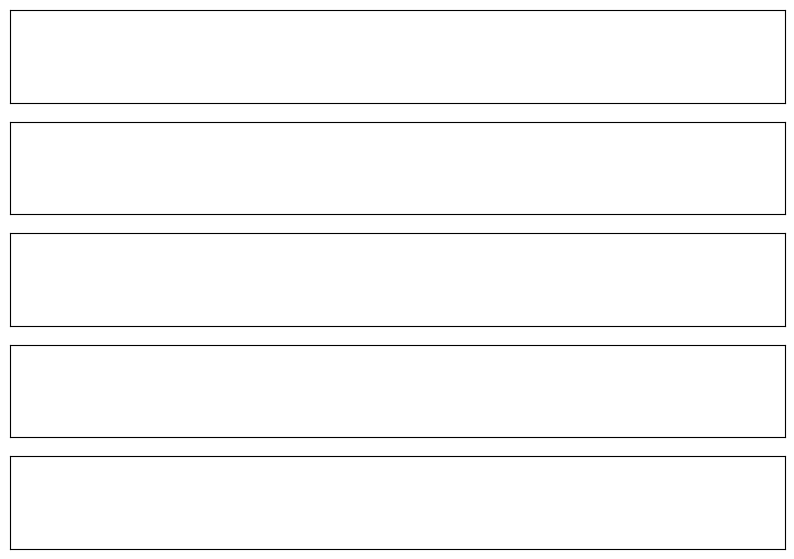

In [61]:
from celluloid import Camera
plt.tight_layout()
fig,axs = plt.subplots(5, 1, figsize=(10, 7))
camera = Camera(fig)
data = sample_data.iloc[5000:].apply(lambda x: np.log(x))
colors = ["darkred", "darkblue", "darkgreen", "darkorange", "darkviolet"]
for x in range(5):
    axs[x].yaxis.set_visible(False)
    axs[x].xaxis.set_visible(False)

for x in range(2000):
    for y in range(5):
        axs[y].plot(data.iloc[x:5000+x][data.columns[y]].values, color=colors[y], linewidth=2)
    camera.snap()
animation = camera.animate()


In [62]:
from IPython.display import HTML
HTML(animation.to_html5_video())